# Artigo 3 - What is the Dragon?

## Objetivo
Para esse terceiro artigo, o objetivo é ir colocar em prática o que já foi abordado no primeiro e no segundo, tendo como objetivo criar uma nova inteligência artificial capaz de classificar imagens, que nesse caso, foi decidido que ela será treinada para conseguir classificar entre dragões do filme como treinar o seu dragão. Além da criação da IA em si, no final ela será disponibilizada na plataforma Hugging Face, sendo que para isso, ao longo do processo serão utilizados mais funções, que irão trazer a possibilidade de visualizar melhor os erros da IA e por consequência corrigi-los e assim conseguir chegar em um modelo bem treinado.

## Motivação
Analisar de qual tipo de dragão é muito importante, principalmente para novos vikings, uma vez que cada um tem um jeito de domar diferente.

## Requisitos
Para que se possa realizar a construção da IA precisa de duas coisas, primeiro, dos dados que serão usados tanto para treinar quanto para realizar o teste, que serão adquiridos usando a biblioteca **duckduckgo_search** e da criação da própria IA, que será feito através da biblioteca **fastai**, onde serão instalados na célula 01.

In [1]:
#Parâmetros:
#U - Serve para pegar a biblioteca atualizada
#qq - Serve para fazer toda a instalação em silêncio

!pip install -Uqq fastai
!pip install -Uqq duckduckgo_search

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.7/75.7 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.0/76.0 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 62.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 9.1 MB/s eta 0:00:00


## Dados
O próximo passo se da em conseguir os dados para fazer todo o treinamento da IA, para isso sera usado justamente a biblioteca instalada do **DuckDuckGo** para procurar as imagens, como mostrado na célula 02.

In [2]:
from duckduckgo_search import ddg_images
from fastcore.all import *

# A seguir se tem a função de pesquisa que recebe dois parâmetros:
# Tipo de imagem que esta sendo buscada
# Quantidade de imagem que esta sendo buscado

def search_imagens(term, max_images=300): return L(ddg_images(term, max_results=max_images)).itemgot('image')

Agora chegou o momento de testas para ver quais imagens o DuckDuckGo irá retornar, fazendo sua visualização usando uma biblioteca da fastai, onde os passos seguiram a sequência demostrada a seguir e podem ser visualizados na célula 03.

* search_imagens: Procura pelas imagens e retorna a Url
* download_url: Baixa a imagens passada pela Url achada pela função search
* Image.Open: Abre a Imagem para poder ser visualizada.

In [3]:
# Antes de se realziar esse processo, se deve importar as bibliotecas que serão usadas
from fastdownload import download_url
from fastai.vision.all import *

#Agora pode se executar o processo de baixar e visualizar as imagens.

night_fury = search_imagens('Night Fury', max_images=1)[0]
deadly_nadder = search_imagens('Deadly Nadder', max_images=1)[0]
gronckle = search_imagens('Gronckle', max_images=1)[0]
monstrous_nightmare = search_imagens('Monstrous Nightmare', max_images=1)[0]
ziper_chilling = search_imagens('Ziperarrepiante', max_images=1)[0]

download_url(night_fury, 'night_fury.jpg', show_progress=False)
download_url(deadly_nadder, 'deadly_nadder.jpg', show_progress=False)
download_url(gronckle, 'gronckle.jpg', show_progress=False)
download_url(monstrous_nightmare, 'monstrous_nightmare.jpg', show_progress=False)
download_url(ziper_chilling, 'ziper_chilling.jpg', show_progress=False)

/usr/local/lib/python3.10/dist-packages/duckduckgo_search/compat.py:40: UserWarning: ddg_images is deprecated. Use DDGS().images() generator
  warnings.warn("ddg_images is deprecated. Use DDGS().images() generator")


Path('ziper_chilling.jpg')

Houve uma mistura entre pesquisar em português e inglês devido ao nome **Ziper-chilling** que retornava imagens de ziper devido à semelhança entre os nomes.

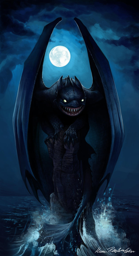

In [4]:
Image.open('night_fury.jpg').to_thumb(256, 256)

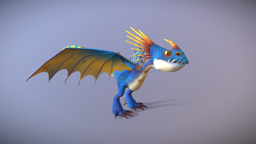

In [5]:
Image.open('deadly_nadder.jpg').to_thumb(256, 256)

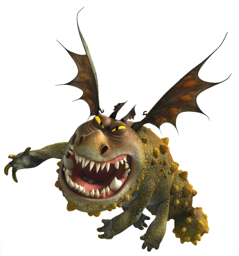

In [6]:
Image.open('gronckle.jpg').to_thumb(256, 256)

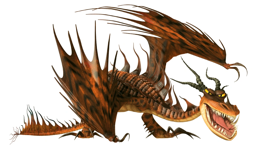

In [7]:
Image.open('monstrous_nightmare.jpg').to_thumb(256, 256)

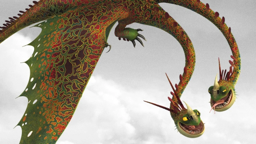

In [8]:
Image.open('ziper_chilling.jpg').to_thumb(256, 256)

Agora pode se começar a popular os dados que serão usados para treino e teste, salvando cada grupo em um diretório diferente. Sendo que será usado mais uma função, que é a sleep, onde ela é usada para poder evitar problemas no tráfego de imagens.

Como definido anteriormente, será pegado no máximo 300 de cada tipo de imagem, que pode ser observado na célula 09.

In [9]:
from time import sleep

searchs = 'Night Fury', 'Deadly Nadder', 'Gronckle', 'Monstrous Nightmare', 'Ziperarrepiante'
path = Path('Dragons')

for Dragons in searchs:
    dest = (path/Dragons)
    dest.mkdir(exist_ok=True, parents=True)
    download_images(dest, urls=search_imagens(f'{Dragons}'))
    sleep(10)
    resize_images(path/Dragons, max_size=400, dest=path/Dragons) #Redimensionamento de todas as imagens

Agora antes que possamos treinar o modelo, é preciso verificar se houve algum erro ao baixar alguma imagens, e para isso é usado a função da célula 09 que caso encontre links com erro, irá descartar essas imagens.

In [10]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
len(failed)

12

## Treinamento do Modelo
Agora que todos os dados foram coletados e os prejudicados foram descartados, pode-se começar a treinar o modelo. Sendo que para isso, é necessário a criação de **DataLoaders** que é um objeto que vai especificar dois conjuntos, um de imagens usadas para treinamento do modelo e um para validação do modelo, e para a sua criação, será usada o **DataBlock** da biblioteca da **fastai**. Onde o processo pode ser observado na célula 10.

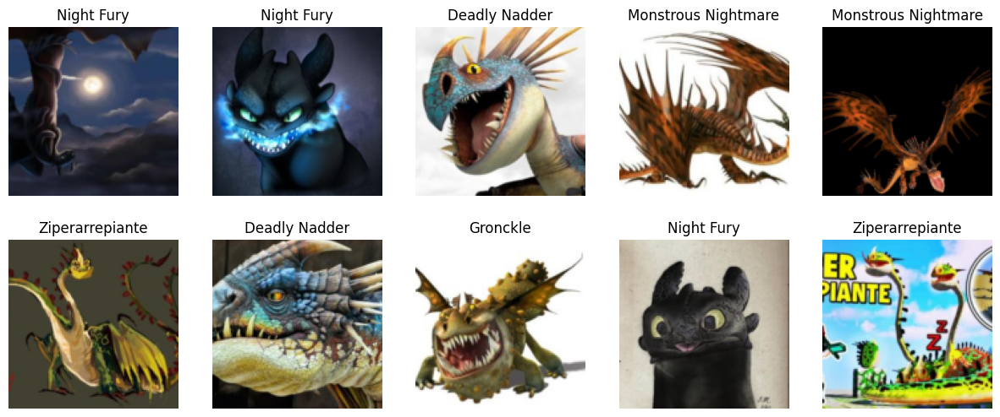

In [33]:
Dragons = DataBlock(
    blocks=(ImageBlock, CategoryBlock), # Específica que a entrada são imagens e a saída são elas categorizadas
    get_items=get_image_files,  # Retorna uma lista de todas as imagens
    splitter=RandomSplitter(valid_pct=0.2, seed=42), # Divisão dos conjuntos de treinamento e de validação = 80%/20%
    get_y=parent_label, # Adiciona a label conforme a pasta que está a imagem
    item_tfms=Resize(128) # Redimensionando as Imagens
)

dls = Dragons.dataloaders(path) # Carregandoas imagens
dls.valid.show_batch(max_n=10, nrows=2) # Mostrando os dados categorizados

### Variações de Dados
Para aumentar ainda mais os dados que existem, pode-se criar variações dos mesmos, para que se aumenta a base de dados mas sem alterar o significado de cada um deles, e nem mesmo salvando elas, uma vez que elsas serão transformadas mas armazenadas em memória ram, e para isso existem diversas técnicas, nesse caso, será aplicado a de **Resize** com o método **Squisih** e de **Aug_Transforms**.

Como pode ser observado na célula 11.

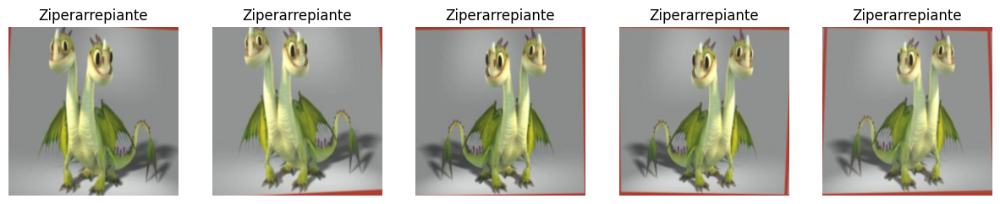

In [34]:
Dragons = Dragons.new(item_tfms=Resize(224, ResizeMethod.Squish), batch_tfms=aug_transforms(0.2))
dls = Dragons.dataloaders(path)
dls.train.show_batch(max_n=5, nrows=1, unique=True)

Para o próximo passo é necessário criar o modelo, sendo que como se trata de imagens bem diferentes, não há uma necessidade de se usar um modelo com muitas camadas para distinguir as imagens, sendo assim, será feito um teste com o modelo **resnet18** e o modelo **resnt34** (Esse modelo foi escolhido uma vez que se torna interessante, pelo fato de que um dragão pode apresentar mais de uma versão em suas cores e tamanhos. E uma vez que essa rede carrega resíduos de camadas para serem utilizados em outras camadas, podem acabar por ajudar a rede), depois, será feito um ajuste final nos dados e testado os dois modelos novamente, colocando em produção aquele que se sair melhor usando sua matriz de confusão.

Sendo que para isso será usado também a função fine_tune() da fastai que já irá ajustar um modelo pré-treinado utilizando as melhores práticas.

Isso significado que será partido do princípio de um modelo que alguém treinou usando um conjunto de dados e será ajustado os pesos para que se possa se adequar ao conjunto de dados que se deseja usar.

Esse processo pode ser visto na célula 12 e 13, onde foram usados três treinamentos para cada modelo, isso para que se possa atingir uma boa precisão, além de parar nesse momento ajuda a ter um modelo treinado e não um decorado.

In [36]:
learn_18 = vision_learner(dls, resnet18, metrics=error_rate)
learn_18.fine_tune(3)

epoch,train_loss,valid_loss,error_rate,time
0,2.651191,2.248429,0.705128,00:02


epoch,train_loss,valid_loss,error_rate,time
0,1.538601,0.997895,0.423077,00:02
1,1.192562,0.578395,0.256410,00:02
2,0.914489,0.377167,0.166667,00:02


In [38]:
learn_34 = vision_learner(dls, resnet34, metrics=error_rate)
learn_34.fine_tune(3)

epoch,train_loss,valid_loss,error_rate,time
0,2.761899,2.116685,0.487179,00:03


epoch,train_loss,valid_loss,error_rate,time
0,1.175350,0.794119,0.282051,00:05
1,0.894702,0.320765,0.128205,00:04
2,0.656692,0.251378,0.102564,00:04


Como pode ser observado, os dois modelos tiveram erro, então agora sera dado uma olhada na matriz de confusão dos dois e depois realziado uma limpeza dos dados.

Como mostrado na célula 14 até a 17.

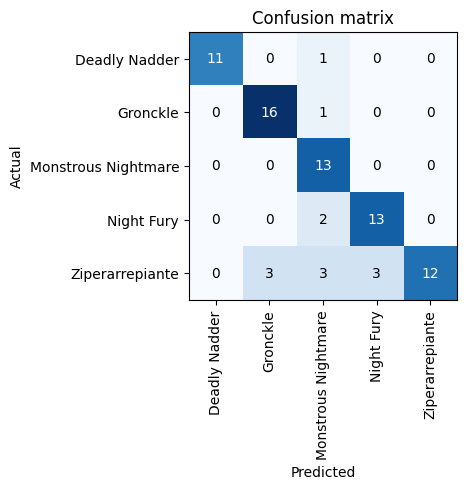

In [42]:
interp = ClassificationInterpretation.from_learner(learn_18)
interp.plot_confusion_matrix()

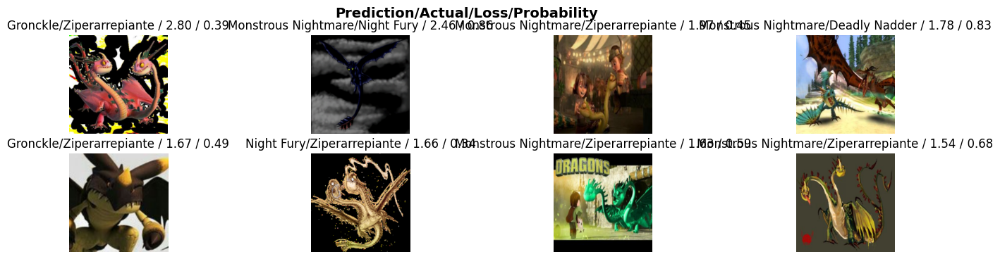

In [43]:
interp.plot_top_losses(8, nrows=2, figsize=(17, 4))

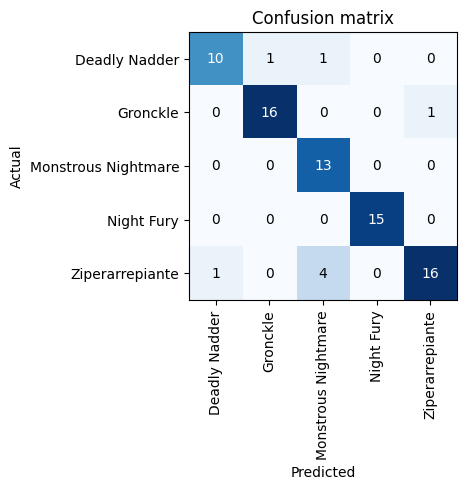

In [44]:
interp = ClassificationInterpretation.from_learner(learn_34)
interp.plot_confusion_matrix()

Para melhor visualização pode-se dar uma olhada nessa imagem através de uma função, presente na célula 18 e 19.

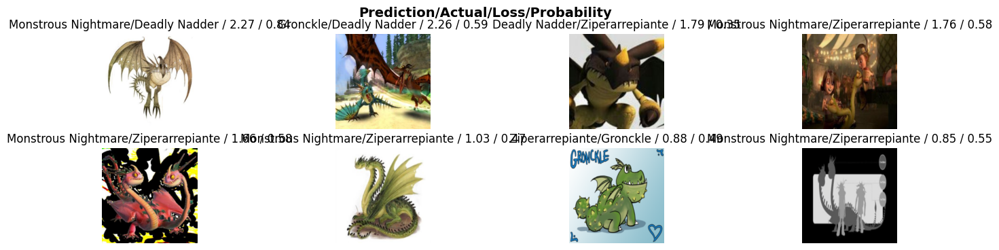

In [45]:
interp.plot_top_losses(8, nrows=2, figsize=(17, 4))

É observado que o erro foram em sua maioria imagens diferentes, agora então sera realizado uma limpeza nos dados levando em conta não uma imagem especificado que o modelo errou, mas sim aquelas que percebe-se que não deveriam estar onde estavam.
So que antes para essa tarefa é necessário importar a função que irá permiter a execução dessa atividade da biblioteca **fastai**.Essa tarefa pode ser observada na célula 20.

In [46]:
from fastai.vision.widgets import *

cleaner = ImageClassifierCleaner(learn_18)
cleaner

Depois de marcar a ação que deve acontecer com cada um dos itens marcados, começa o processo de realizar as ações sobre eles criando um novo data base com as correções implementadas, no caso, a imagem que gerou dúvdas será excluída. Todo o processo pode ser obsrevado na célula 21.

In [47]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

Agora pode-se criar novamente o DataBlock e treinar os modelos, so que dessa vez com 5 etapas, como demostrado na célula 22 a 24.

In [48]:
Dragons = Dragons.new(item_tfms=RandomResizedCrop(224, min_scale=0.5), batch_tfms=aug_transforms())
dls = Dragons.dataloaders(path)

In [56]:
learn_18 = vision_learner(dls, resnet18, metrics=error_rate)
learn_18.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,time
0,2.929504,1.571396,0.564103,00:02


epoch,train_loss,valid_loss,error_rate,time
0,1.642416,0.892520,0.358974,00:02
1,1.313261,0.531835,0.192308,00:02
2,1.049587,0.363813,0.128205,00:03
3,0.873842,0.331873,0.141026,00:02
4,0.735581,0.338337,0.128205,00:02


In [55]:
learn_34 = vision_learner(dls, resnet34, metrics=error_rate)
learn_34.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,time
0,2.662918,1.728190,0.615385,00:02


epoch,train_loss,valid_loss,error_rate,time
0,1.415082,0.802331,0.320513,00:02
1,1.164238,0.368484,0.141026,00:02
2,0.891361,0.299470,0.089744,00:03
3,0.712043,0.300185,0.089744,00:02
4,0.581559,0.305920,0.115385,00:02


Com isso se observa que o modelo usando **Resnet34** se saiu melhor pouca coisa, porém o suficiente para ser o escolhido para ser levado em produção.

## Deploy
Para realizar o deploy o modelo será exportado como demostrado na célula 18 e será feito o upload no site do Huggingface

In [57]:
learn_34.export("Dragon.pkl")

O deploy pode ser encontrado no link [Dragon](https://huggingface.co/spaces/fastaioncampus/Dragons)

## Bibliografia
[1] [Deployment](https://course.fast.ai/Lessons/lesson2.html)

[2] [MathWorks](https://www.mathworks.com/?s_tid=gn_logo)